## Zero-shot Delta vector Approximation

/opt/conda/envs/erase/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/opt/conda/envs/erase/lib/python3.10/site-packages/diffusers/models/transformers/transformer_2d.py:34: FutureWarning: `Transformer2DModelOutput` is deprecated and will be removed in version 1.0.0. Importing `Transformer2DModelOutput` from `diffusers.models.transformer_2d` is deprecated and this will be removed in a future version. Please use `from diffusers.models.modeling_outputs import Transformer2DModelOutput`, instead.
  deprecate("Transformer2DModelOutput", "1.0.0", deprecation_message)
Loading pipeline components...: 100%|██████████| 7/7 [00:00<00:00,  8.10it/s]


Original generated image:


100%|██████████| 50/50 [00:06<00:00,  7.79it/s]


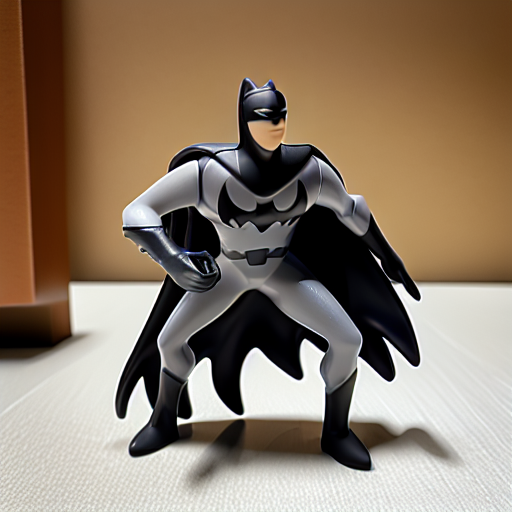

Suppressed cape:


100%|██████████| 50/50 [00:06<00:00,  7.81it/s]


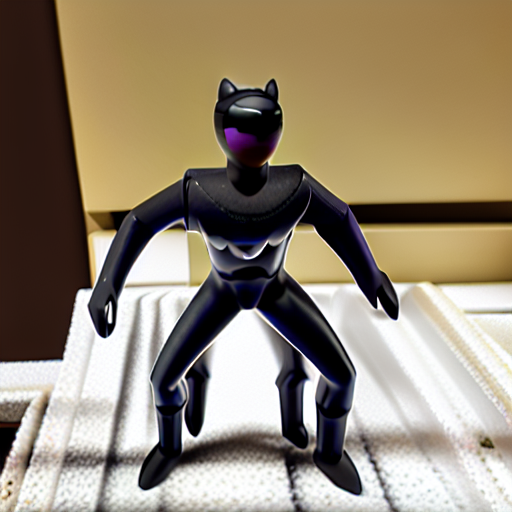

In [1]:
import torch
from utils.supp_attention import prepare_unet, AttentionStore, CCCrossAttnProcessor
from models import diffusion
from utils.prompt_emb import PromptEmbedding, EmbeddingEdit
from types import MethodType
ALPHA = 1.0

def new_key_handler(self,key):
  split_size = [*[8]*2, *[8]*self.num_additional_context]
  keys=key.split(split_size)
  new_key=torch.cat([keys[0],keys[2],keys[2],keys[3]],dim=0)
  return new_key

def new_value_handler(self,attention_probs,value,focus_on_unconditional):
  split_size = [*[8]*2, *[8]*self.num_additional_context]
  values=value.split(split_size)
  new_value=torch.cat([values[0],values[3],values[2],values[3]],dim=0)
  return torch.bmm(attention_probs, new_value)

model = diffusion('runwayml/stable-diffusion-v1-5')
model.pipe.load_lora_weights("./dreambooth",
                              weight_name = "batman_pytorch_lora_weights.safetensors",
                              adapter_name = 'batman')
model.pipe.fuse_lora(adapter_names=["batman"], lora_scale=1.0)
model.pipe.unload_lora_weights()

seed = 0
generator = torch.Generator('cuda').manual_seed(seed)

# Original generated image     
print("Original generated image:")   
model.pipe(prompt="a photo of (sks figure)",
            num_inference_steps=50,
            generator=generator).images[0].show()

# Set monitor prompts
monitor_prompt=['a photo of (sks figure) (sks figure).', 'a photo of (sks figure) (sks figure).']
moniter_emb=[PromptEmbedding(i,text_model=model.pipe.text_encoder,tokenizers=model.pipe.tokenizer) for i in monitor_prompt]

# Set edit embedding and apply ad_delta
edit=EmbeddingEdit(dim=768)

# Appoximate delta:
edit.delta = PromptEmbedding(prompt="cape",text_model=model.pipe.text_encoder,tokenizers=model.pipe.tokenizer).get_word_emb("cape") 

# Adapt delta
edit(moniter_emb[0], "sks figure", alpha=ALPHA, order=1) 
edit(moniter_emb[1], "sks figure", alpha=-1*ALPHA, order=1)

# Set for generation
prompt_emb=model.prompt('a photo of (sks figure).')
generator = torch.Generator('cuda').manual_seed(seed)

# Register unet
attention_store = AttentionStore(moniter_emb, average=True)

attention_store.key_handler=MethodType(new_key_handler,attention_store)                                  
attention_store.value_handler=MethodType(new_value_handler,attention_store)

prepare_unet(model.pipe.unet,attention_store,
              filter_set=[], 
              self_attn=False, 
              cross_attn=True,  
              CrossAttnProcessor=CCCrossAttnProcessor)

# Generate image      
print("Suppressed cape:")   
model.pipe(prompt_embeds=prompt_emb.embedding,
            num_inference_steps=50,
            generator=generator).images[0].show()

# Unregister unet
prepare_unet(model.pipe.unet,None,self_attn=False,cross_attn=True)

## Mask-based Delta vector Optimization

In [2]:
import numpy as np
from PIL import Image

def get_mask_from_path(mask_path, size=64, left=0, right=0, top=0, bottom=0):
    image = np.array(Image.open(mask_path))
    h, w = image.shape
    left = min(left, w-1)
    right = min(right, w - left - 1)
    top = min(top, h - left - 1)
    bottom = min(bottom, h - top - 1)
    image = image[top:h-bottom, left:w-right]
    h, w = image.shape
    if h < w:
        offset = (w - h) // 2
        image = image[:, offset:offset + h]
    elif w < h:
        offset = (h - w) // 2
        image = image[offset:offset + w]
    image = np.array(Image.fromarray(image).resize((size, size)))

    mask = image>125
    return torch.from_numpy(mask).float()

def visualize_cross_attention(cross_attns):
    leng = cross_attns.shape[-1]
    cross_attns = cross_attns.mean(0, keepdims=True)
    images = []
    for i in range(leng):
        image = cross_attns[:, :, i]
        w = int(image.shape[1] ** 0.5)
        image = image.reshape(w, w)
        image = 255 * image / image.max()
        image = image.unsqueeze(-1).expand(*image.shape, 3)
        image = image.cpu().detach().numpy().astype(np.uint8)
        image = np.array(Image.fromarray(image).resize((256, 256)))
        images.append(image)
    pil_img = to_pil_image(np.stack(images, axis=0))
    pil_img.show()


def to_pil_image(images, num_rows=1, offset_ratio=0.02):
    if type(images) is list:
        num_empty = len(images) % num_rows
    elif images.ndim == 4:
        num_empty = images.shape[0] % num_rows
    else:
        images = [images]
        num_empty = 0

    empty_images = np.ones(images[0].shape, dtype=np.uint8) * 255
    images = [image.astype(np.uint8) for image in images] + [empty_images] * num_empty
    num_items = len(images)

    h, w, c = images[0].shape
    offset = int(h * offset_ratio)
    num_cols = num_items // num_rows
    image_ = np.ones((h * num_rows + offset * (num_rows - 1),
                      w * num_cols + offset * (num_cols - 1), 3), dtype=np.uint8) * 255
    for i in range(num_rows):
        for j in range(num_cols):
            image_[i * (h + offset): i * (h + offset) + h:, j * (w + offset): j * (w + offset) + w] = images[
                i * num_cols + j]

    pil_img = Image.fromarray(image_)
    return pil_img

  0%|          | 0/50 [00:00<?, ?it/s]

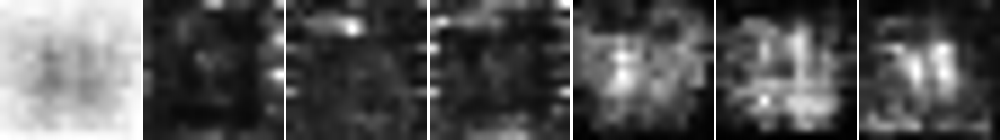

  2%|▏         | 1/50 [00:00<00:25,  1.92it/s, loss=0.123, attn loss=0.121, latent loss=0.00498]

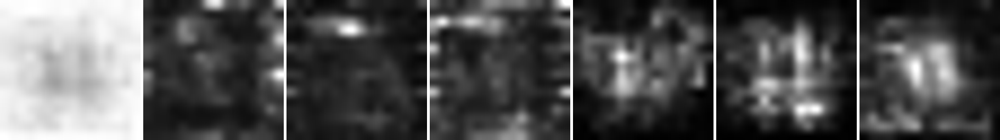

  4%|▍         | 2/50 [00:00<00:21,  2.25it/s, loss=0.0878, attn loss=0.0851, latent loss=0.00539]

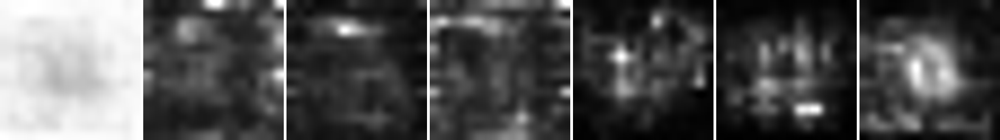

  6%|▌         | 3/50 [00:01<00:19,  2.37it/s, loss=0.0746, attn loss=0.0717, latent loss=0.00578]

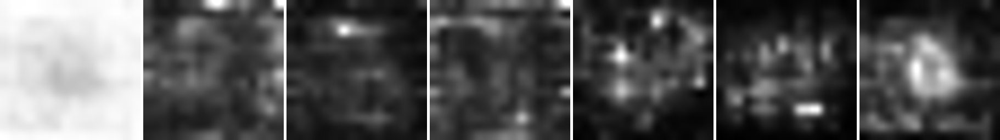

  8%|▊         | 4/50 [00:01<00:18,  2.44it/s, loss=0.0713, attn loss=0.0683, latent loss=0.00605]

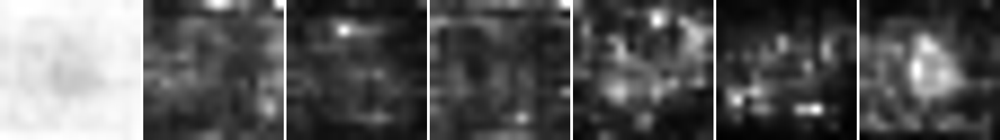

 10%|█         | 5/50 [00:02<00:18,  2.49it/s, loss=0.0705, attn loss=0.0674, latent loss=0.00609]

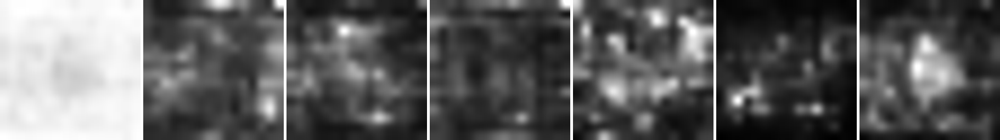

 12%|█▏        | 6/50 [00:02<00:17,  2.51it/s, loss=0.0703, attn loss=0.0672, latent loss=0.00615]

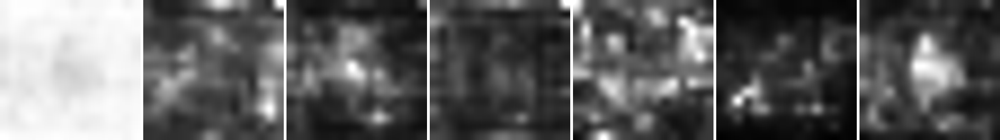

 14%|█▍        | 7/50 [00:02<00:17,  2.53it/s, loss=0.0705, attn loss=0.0671, latent loss=0.00667]

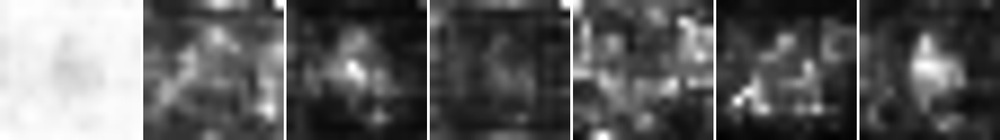

 16%|█▌        | 8/50 [00:03<00:16,  2.54it/s, loss=0.0706, attn loss=0.0671, latent loss=0.00709]

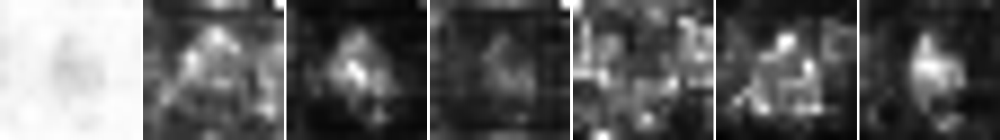

 18%|█▊        | 9/50 [00:03<00:16,  2.54it/s, loss=0.0707, attn loss=0.067, latent loss=0.00743] 

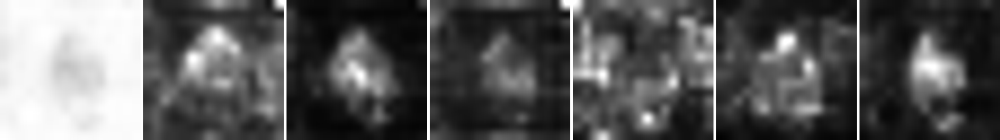

 20%|██        | 10/50 [00:04<00:15,  2.55it/s, loss=0.0708, attn loss=0.0669, latent loss=0.00762]

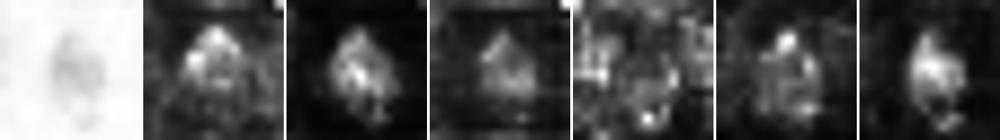

 22%|██▏       | 11/50 [00:04<00:15,  2.55it/s, loss=0.0705, attn loss=0.0669, latent loss=0.00732]

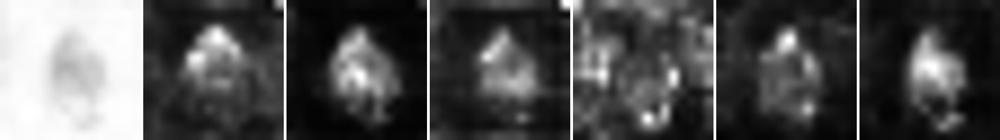

 24%|██▍       | 12/50 [00:04<00:14,  2.56it/s, loss=0.0703, attn loss=0.0668, latent loss=0.00707]

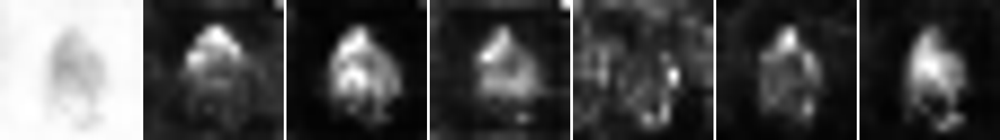

 26%|██▌       | 13/50 [00:05<00:14,  2.56it/s, loss=0.0704, attn loss=0.0667, latent loss=0.00736]

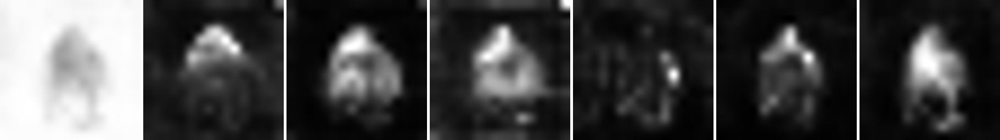

 28%|██▊       | 14/50 [00:05<00:14,  2.57it/s, loss=0.0704, attn loss=0.0667, latent loss=0.00732]

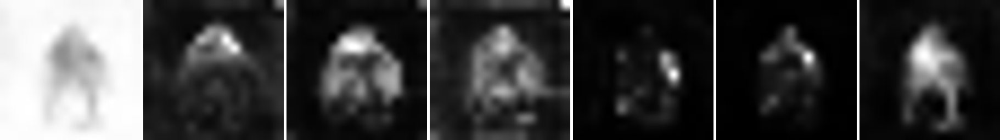

 30%|███       | 15/50 [00:05<00:13,  2.58it/s, loss=0.0706, attn loss=0.0669, latent loss=0.00732]

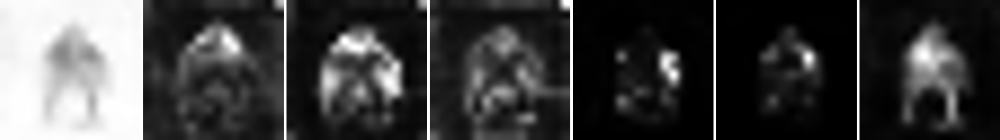

 32%|███▏      | 16/50 [00:06<00:13,  2.59it/s, loss=0.0709, attn loss=0.0672, latent loss=0.00743]

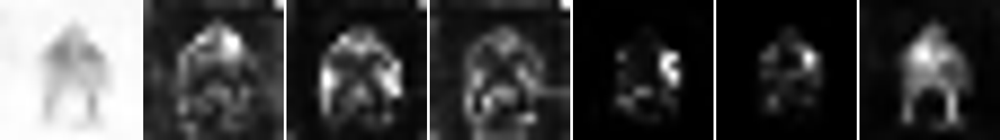

 34%|███▍      | 17/50 [00:06<00:12,  2.59it/s, loss=0.0709, attn loss=0.0672, latent loss=0.00746]

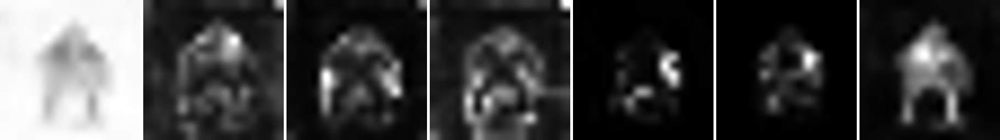

 36%|███▌      | 18/50 [00:07<00:12,  2.59it/s, loss=0.0704, attn loss=0.0667, latent loss=0.00736]

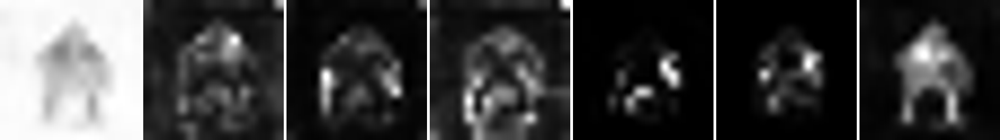

 38%|███▊      | 19/50 [00:07<00:11,  2.59it/s, loss=0.0698, attn loss=0.0662, latent loss=0.00724]

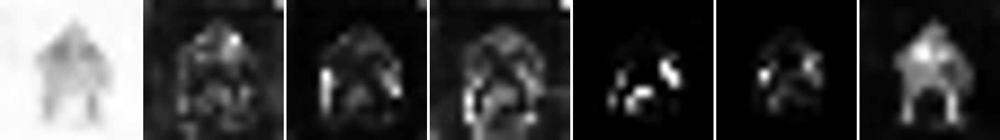

 40%|████      | 20/50 [00:07<00:11,  2.59it/s, loss=0.0692, attn loss=0.0657, latent loss=0.00718]

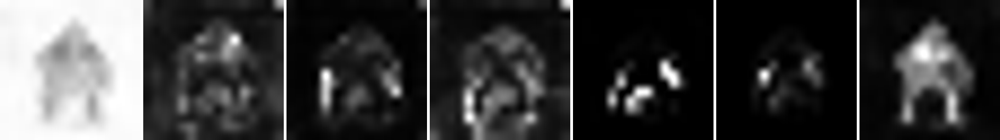

 42%|████▏     | 21/50 [00:08<00:11,  2.59it/s, loss=0.0688, attn loss=0.0653, latent loss=0.0071] 

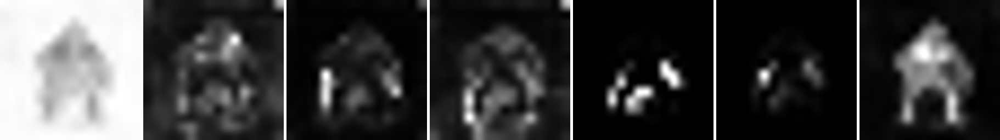

 44%|████▍     | 22/50 [00:08<00:10,  2.59it/s, loss=0.0685, attn loss=0.065, latent loss=0.00704]

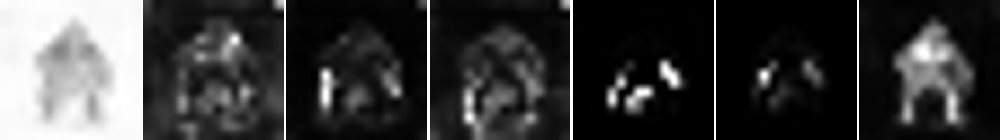

 46%|████▌     | 23/50 [00:09<00:10,  2.60it/s, loss=0.0683, attn loss=0.0648, latent loss=0.00698]

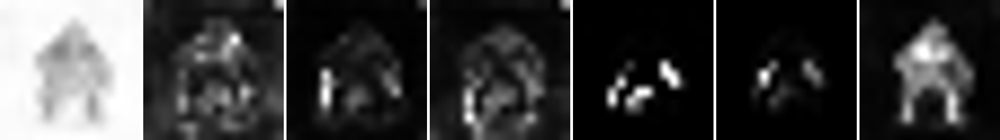

 48%|████▊     | 24/50 [00:09<00:10,  2.60it/s, loss=0.0682, attn loss=0.0647, latent loss=0.00694]

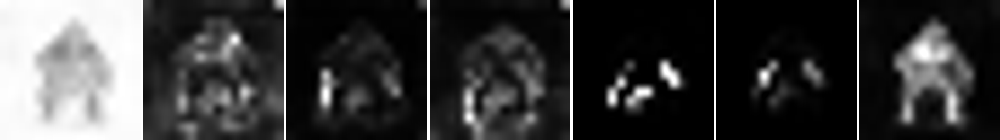

 50%|█████     | 25/50 [00:09<00:09,  2.60it/s, loss=0.068, attn loss=0.0646, latent loss=0.00685] 

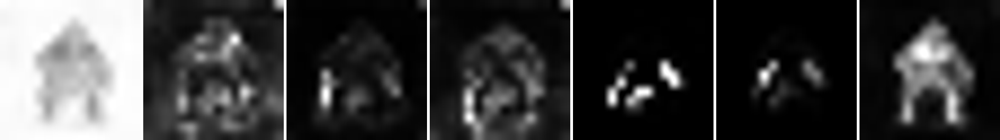

 52%|█████▏    | 26/50 [00:10<00:09,  2.60it/s, loss=0.0678, attn loss=0.0644, latent loss=0.00669]

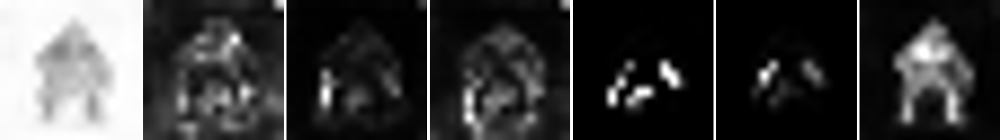

 54%|█████▍    | 27/50 [00:10<00:08,  2.60it/s, loss=0.0676, attn loss=0.0644, latent loss=0.00653]

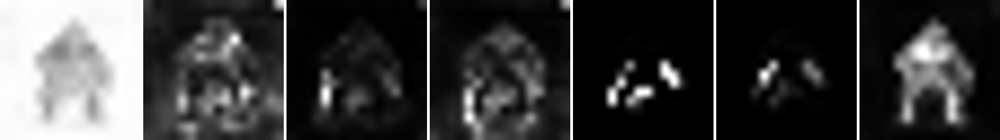

 56%|█████▌    | 28/50 [00:10<00:08,  2.60it/s, loss=0.0674, attn loss=0.0643, latent loss=0.00623]

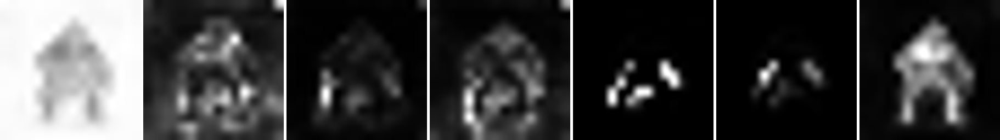

 58%|█████▊    | 29/50 [00:11<00:08,  2.60it/s, loss=0.0673, attn loss=0.0642, latent loss=0.00623]

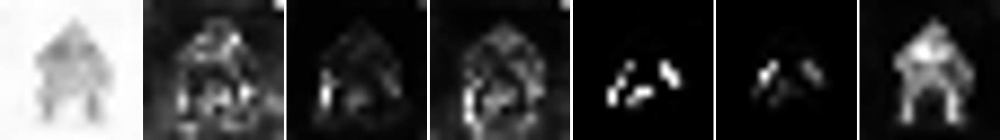

 60%|██████    | 30/50 [00:11<00:07,  2.60it/s, loss=0.0672, attn loss=0.0642, latent loss=0.00606]

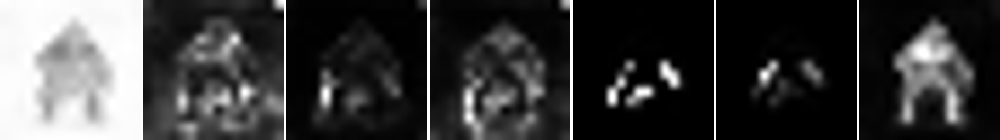

 62%|██████▏   | 31/50 [00:12<00:07,  2.60it/s, loss=0.0671, attn loss=0.0641, latent loss=0.00582]

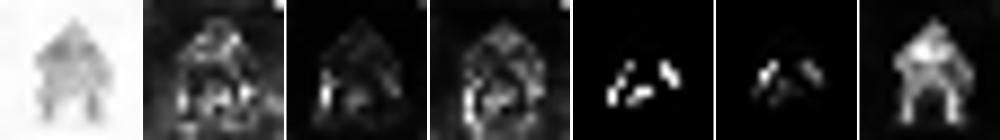

 64%|██████▍   | 32/50 [00:12<00:06,  2.60it/s, loss=0.067, attn loss=0.0641, latent loss=0.00581] 

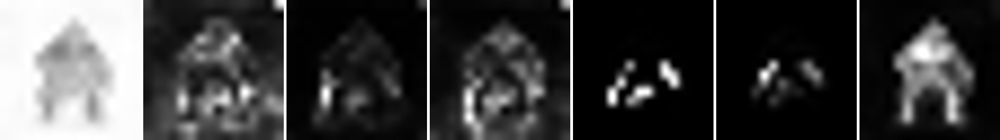

 66%|██████▌   | 33/50 [00:12<00:06,  2.60it/s, loss=0.067, attn loss=0.0641, latent loss=0.00581]

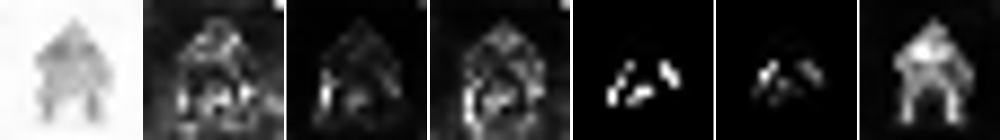

 68%|██████▊   | 34/50 [00:13<00:06,  2.59it/s, loss=0.0669, attn loss=0.064, latent loss=0.00565]

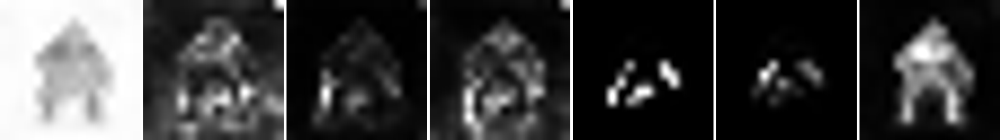

 70%|███████   | 35/50 [00:13<00:05,  2.59it/s, loss=0.0668, attn loss=0.064, latent loss=0.00572]

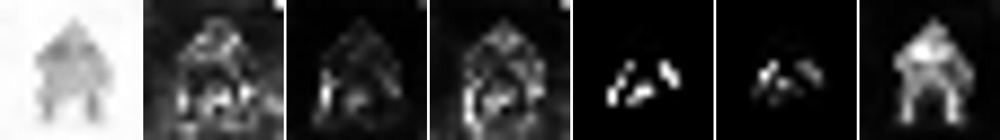

 72%|███████▏  | 36/50 [00:14<00:05,  2.59it/s, loss=0.0668, attn loss=0.0639, latent loss=0.0058]

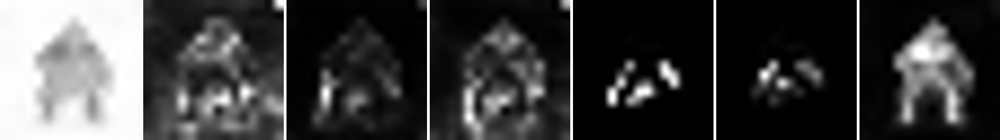

 74%|███████▍  | 37/50 [00:14<00:05,  2.59it/s, loss=0.0668, attn loss=0.0639, latent loss=0.00578]

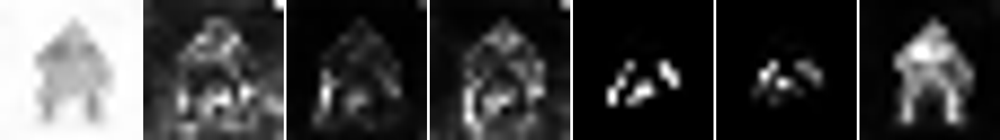

 76%|███████▌  | 38/50 [00:14<00:04,  2.59it/s, loss=0.0667, attn loss=0.0638, latent loss=0.00582]

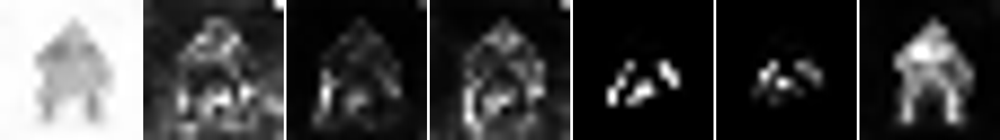

 78%|███████▊  | 39/50 [00:15<00:04,  2.58it/s, loss=0.0667, attn loss=0.0638, latent loss=0.00589]

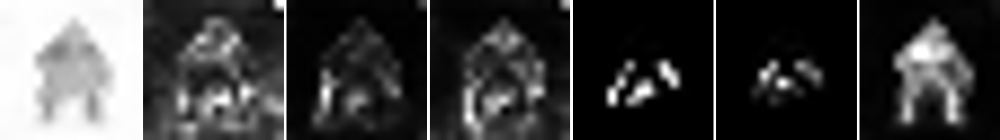

 80%|████████  | 40/50 [00:15<00:03,  2.58it/s, loss=0.0667, attn loss=0.0637, latent loss=0.00599]

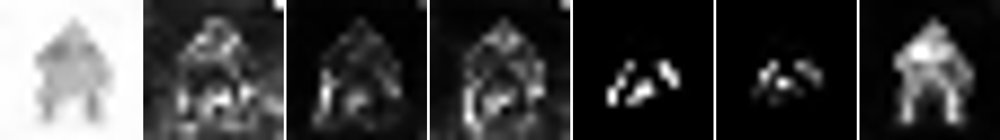

 82%|████████▏ | 41/50 [00:16<00:03,  2.58it/s, loss=0.0668, attn loss=0.0637, latent loss=0.00633]

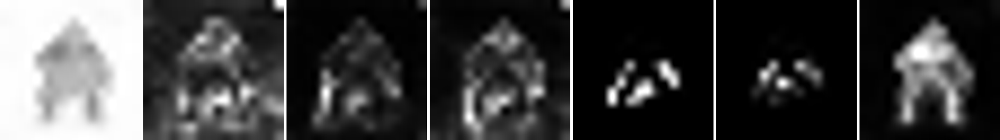

 84%|████████▍ | 42/50 [00:16<00:03,  2.59it/s, loss=0.0669, attn loss=0.0636, latent loss=0.00648]

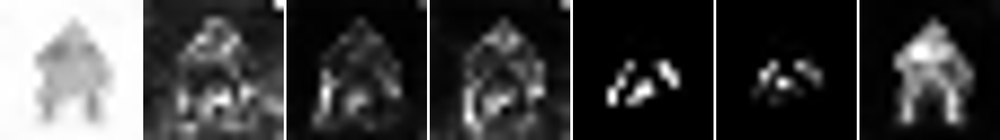

 86%|████████▌ | 43/50 [00:16<00:02,  2.59it/s, loss=0.067, attn loss=0.0636, latent loss=0.00676] 

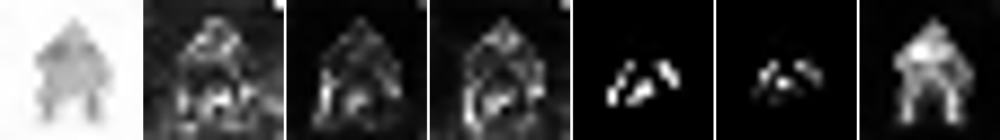

 88%|████████▊ | 44/50 [00:17<00:02,  2.59it/s, loss=0.0672, attn loss=0.0636, latent loss=0.00731]

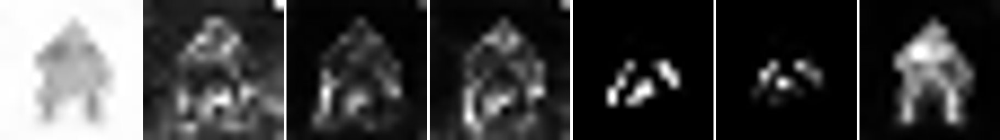

 90%|█████████ | 45/50 [00:17<00:01,  2.59it/s, loss=0.0676, attn loss=0.0635, latent loss=0.00814]

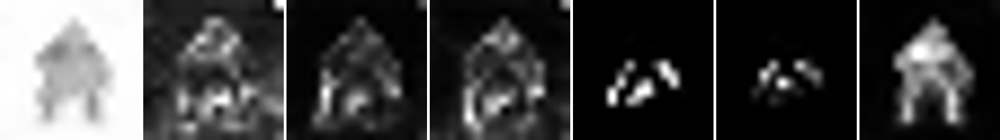

 92%|█████████▏| 46/50 [00:17<00:01,  2.59it/s, loss=0.0682, attn loss=0.0635, latent loss=0.00946]

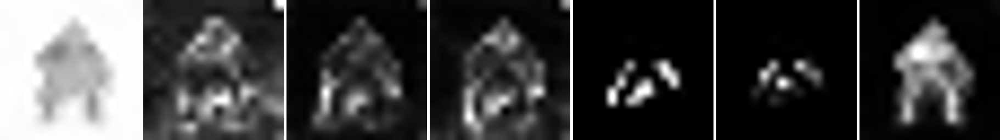

 94%|█████████▍| 47/50 [00:18<00:01,  2.59it/s, loss=0.0693, attn loss=0.0635, latent loss=0.0117] 

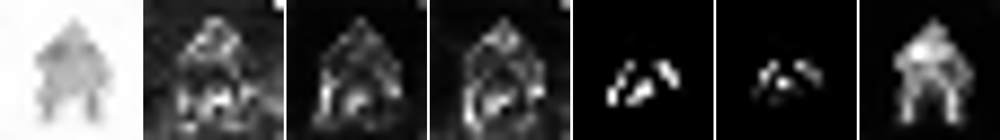

 96%|█████████▌| 48/50 [00:18<00:00,  2.59it/s, loss=0.0719, attn loss=0.0635, latent loss=0.0169]

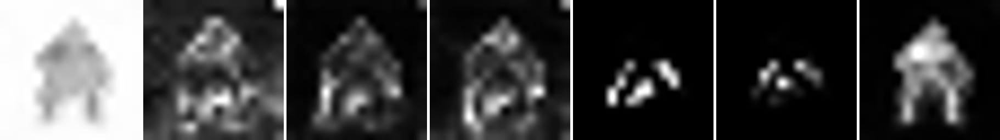

 98%|█████████▊| 49/50 [00:19<00:00,  2.58it/s, loss=0.0857, attn loss=0.0634, latent loss=0.0445]

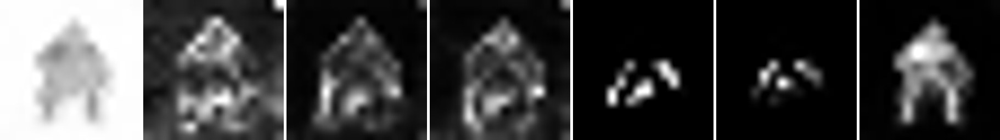

100%|██████████| 50/50 [00:19<00:00,  2.57it/s, loss=0.0642, attn loss=0.0634, latent loss=0.00148]


In [3]:
from utils.ddim_inversion import DDIMInversion
from tqdm import tqdm
from utils.supp_attention import prepare_unet, AttentionStore 
from models import diffusion
from utils.prompt_emb import PromptEmbedding, EmbeddingEdit
from types import MethodType
NUM_DDIM_STEPS=50

def new_value_handler(self,attention_probs,value,focus_on_unconditional):
  split_size = [*[8]*2, *[8]*self.num_additional_context]
  values=value.split(split_size)
  new_value=torch.cat([values[0],values[2],values[2]],dim=0)
  return torch.bmm(attention_probs, new_value)

# Set model
model = diffusion('runwayml/stable-diffusion-v1-5')
model.pipe.load_lora_weights("./dreambooth",
                              weight_name = "batman_pytorch_lora_weights.safetensors",
                              adapter_name = 'sks figure')
model.pipe.fuse_lora(adapter_names=["sks figure"], lora_scale=1.0)
model.pipe.unload_lora_weights()
model.pipe.scheduler.set_timesteps(NUM_DDIM_STEPS)

# Inversion
inversion = DDIMInversion(model.pipe, num_ddim_steps=NUM_DDIM_STEPS) 
inv_latents = inversion.invert(image_path='./data/batman.jpg', prompt='a photo of (sks figure).')

# Initialize delta: To attend to glasses use positive direction
ad_delta = PromptEmbedding(prompt=f"(cape)",text_model=model.pipe.text_encoder,tokenizers=model.pipe.tokenizer).get_word_emb(f"cape")
ad_delta = ad_delta.to('cuda')
ad_delta.requires_grad=True  

edit=EmbeddingEdit(dim=768)
edit.delta = ad_delta

# Get embeddings
prompt_emb=model.prompt('a photo of (sks figure).')
neg_prompt_emb=model.prompt('')

# Get mask
latent_mask = get_mask_from_path('./data/batman_mask.png', size=64).to('cuda')
mask = get_mask_from_path('./data/batman_mask.png', size=16).to('cuda')

# Set Optimizer
optimizer = torch.optim.AdamW([ad_delta], lr=0.1, betas=[0.5, 0.8], weight_decay=0.033)

# Optimize
pbar = tqdm(total=NUM_DDIM_STEPS)
for i in range(NUM_DDIM_STEPS):
    # Register to unet    
    moniter_emb = [PromptEmbedding(prompt=f"a photo of (sks figure)",text_model=model.pipe.text_encoder,tokenizers=model.pipe.tokenizer)]
    edit.delta = ad_delta 
    edit(moniter_emb[0], "sks figure", 1.0)

    attention_store = AttentionStore(moniter_emb, average=True)
    attention_store.value_handler=MethodType(new_value_handler,attention_store)  

    prepare_unet(model.pipe.unet, attention_store, filter_set=[], self_attn=False, cross_attn=True,  
                    CrossAttnProcessor=CCCrossAttnProcessor, )
    
    # Sample one step
    t = model.pipe.scheduler.timesteps[i]
    x_t = inv_latents[NUM_DDIM_STEPS - i]
    x_t_1 = inv_latents[NUM_DDIM_STEPS - i - 1]

    latent_input = torch.cat([x_t]*2)
    latent_input = model.pipe.scheduler.scale_model_input(latent_input, t)
    prompt_embeds = torch.cat([neg_prompt_emb.embedding, prompt_emb.embedding])
    
    pred_noise = model.pipe.unet(latent_input, t, encoder_hidden_states=prompt_embeds).sample
    pred_latents = model.pipe.scheduler.step(pred_noise[1:2], t, x_t, return_dict=False)[0]

    prepare_unet(model.pipe.unet,None,self_attn=False,cross_attn=True)

    # Get mask 
    mask_data = attention_store.get_attention(step=None)
    pred_mask = mask_data['up_cross'][0].chunk(3)[2][:,:,:7]

    # Mask region preserving loss
    span_word = moniter_emb[0]["sks figure"][0]
    attn_loss = (pred_mask[:,:,(span_word.start):(span_word.end+1)].reshape(8, 16, 16,-1) - mask.reshape(1, 16, 16, 1)).abs().mean()

    # Preserve glasses
    latent_loss = ((pred_latents - x_t_1) * latent_mask.reshape(1, 1, 64, 64)).abs().sum() / latent_mask.sum()
    loss = attn_loss + latent_loss * 0.5

    # Calculate loss    
    loss.backward()
    optimizer.step()
    optimizer.zero_grad()
    
    visualize_cross_attention(pred_mask)
    loss_detach = loss.detach().item()
    attn_loss_detach = attn_loss.detach().item()
    latent_loss_detach = latent_loss.detach().item()
    pbar.set_postfix({'loss': loss_detach, 'attn loss': attn_loss_detach, 'latent loss': latent_loss_detach})
    pbar.update()

pbar.close()

Loading pipeline components...: 100%|██████████| 7/7 [00:00<00:00,  7.86it/s]


Original generated image:


100%|██████████| 50/50 [00:06<00:00,  8.25it/s]


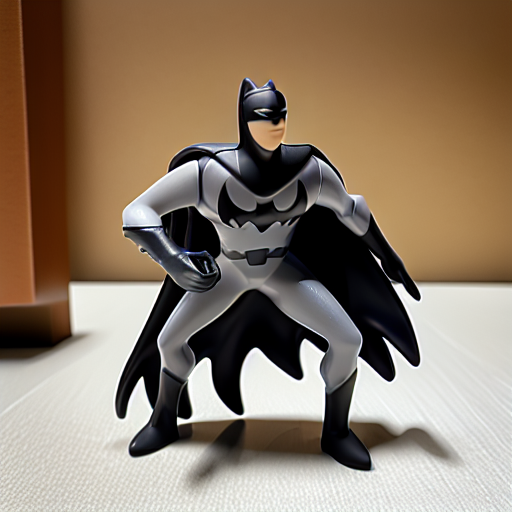

Suppressed cape:


100%|██████████| 50/50 [00:06<00:00,  7.81it/s]


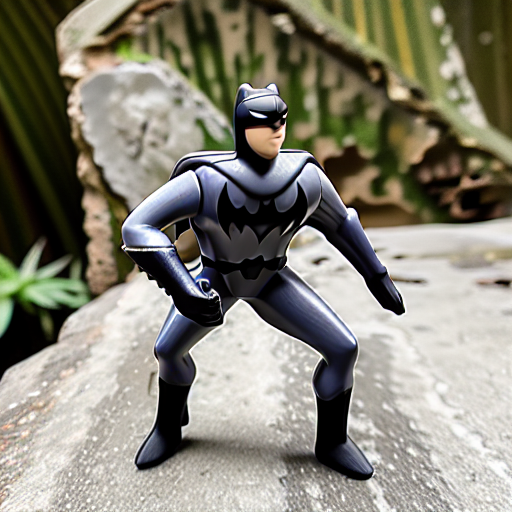

In [5]:
from utils.supp_attention import prepare_unet,AttentionStore 
from models import diffusion
from utils.prompt_emb import PromptEmbedding, Span, EmbeddingEdit
from types import MethodType

ALPHA=3.0

def new_key_handler(self,key):
  split_size = [*[8]*2, *[8]*self.num_additional_context]
  keys=key.split(split_size)
  new_key=torch.cat([keys[0],keys[2],keys[2],keys[3]],dim=0)
  return new_key

def new_value_handler(self,attention_probs,value,focus_on_unconditional):
  split_size = [*[8]*2, *[8]*self.num_additional_context]
  values=value.split(split_size)
  new_value=torch.cat([values[0],values[3],values[2],values[3]],dim=0)
  return torch.bmm(attention_probs, new_value)

model = diffusion('runwayml/stable-diffusion-v1-5')
model.pipe.load_lora_weights("./dreambooth",
                              weight_name = "batman_pytorch_lora_weights.safetensors",
                              adapter_name = 'batman')
model.pipe.fuse_lora(adapter_names=["batman"], lora_scale=1.0)
model.pipe.unload_lora_weights()

seed = 0
generator = torch.Generator('cuda').manual_seed(seed)

# Original generated image     
print("Original generated image:")   
model.pipe(prompt="a photo of (sks figure)",
            num_inference_steps=50,
          generator=generator).images[0].show()

# Set monitor prompts
monitor_prompt=['a photo of (sks figure) (sks figure).', 'a photo of (sks figure) (sks figure).']
moniter_emb=[PromptEmbedding(i,text_model=model.pipe.text_encoder,tokenizers=model.pipe.tokenizer) for i in monitor_prompt]

# Set edit embedding and apply ad_delta
edit=EmbeddingEdit(dim=768)

# Appoximate delta:
edit.delta = ad_delta
# edit.delta = torch.load('./dreambooth/batman.pth')

# Adapt delta
edit(moniter_emb[0], "sks figure", alpha=ALPHA, order=1) 
edit(moniter_emb[1], "sks figure", alpha=-1*ALPHA, order=1)

# Set for generation
prompt_emb=model.prompt('a photo of (sks figure).')
generator = torch.Generator('cuda').manual_seed(seed)

# Register unet
attention_store = AttentionStore(moniter_emb, average=True)

attention_store.key_handler=MethodType(new_key_handler,attention_store)                                  
attention_store.value_handler=MethodType(new_value_handler,attention_store)

prepare_unet(model.pipe.unet,attention_store,
              filter_set=[], 
              self_attn=False, 
              cross_attn=True,  
              CrossAttnProcessor=CCCrossAttnProcessor, )

# Generate image      
print("Suppressed cape:")   
model.pipe(prompt_embeds=prompt_emb.embedding,
            num_inference_steps=50,
          generator=generator).images[0].show()

# Unregister unet
prepare_unet(model.pipe.unet,None,self_attn=False,cross_attn=True)